In [1]:
include("./FPsim.jl")
using .FPsim

In [15]:
using LinearAlgebra, GLMakie
using Statistics
using Random
using BenchmarkTools

In [3]:
sim_t = 500
sim_ensemble_n = 10000

10000

In [4]:
# br = LangevinSim.init_LangevinPath(2, 100, 0.01, LangevinSim.LangevinCoff(t->Diagonal([1.0, 1.0]),
                                #  t->(-0.0*t)), [1.0, 0])

coff = LangevinCoff(t->Diagonal([1.0, 1.0]), t->(-0.5)*t)
br_es = init_LangevinEnsemble(2, sim_t, 0.01, coff, :Delta, sim_ensemble_n)

LangevinEnsemble(2, 500, 0.01, 10000, [-0.017351937609137336 -0.07717610497322733 … 2.363321072572832 2.442291620206512; -0.5809082311833444 -0.5625460553434455 … -1.446798932662409 -1.192701890972064;;; -0.7575435952125604 -0.8420549109437544 … -2.1702597196023725 -2.1641326028087593; -0.32942014138053843 -0.3724086929651543 … -0.9687103688751856 -0.7529355296836113;;; 0.3214073231725385 0.29912220755431207 … 2.3854507681553936 2.4126567823003446; -0.5915218584269444 -0.567838581496053 … -0.4457174015984966 -0.5008082819564058;;; … ;;; -0.5038690470884761 -0.4602294440800295 … 2.031721987379324 2.047930853562323; 0.9098312856236468 0.7108645877874493 … 1.0871761617871116 0.9958085477192918;;; 0.7875367900632648 0.8595901101579945 … 1.1856267993040368 1.180203234322196; -0.5380830284510767 -0.49467732799391306 … -2.572023461418086 -2.614871635356526;;; -0.6469130885894412 -0.7083192924880237 … -0.7465866626997112 -0.7584623241669529; -0.2703057186677402 -0.16796666332128704 … 1.2561220

In [21]:
@benchmark sample_ensemble(br_es, 0.1, 100)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  60.574 μs …  1.220 ms  ┊ GC (min … max): 0.00% … 87.91%
 Time  (median):     68.695 μs              ┊ GC (median):    0.00%
 Time  (mean ± σ):   78.416 μs ± 45.691 μs  ┊ GC (mean ± σ):  2.08% ±  3.66%

   ▃█▂                                                         
  ▂███▅▅▄▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  60.6 μs         Histogram: frequency by time         167 μs <

 Memory estimate: 79.50 KiB, allocs estimate: 18.

In [14]:
spe = sample_ensemble(br_es, 0.01, 100)

spe.selected_parts

100-element Vector{Int64}:
 3530
 6452
 1083
 8999
 7425
 3332
 4305
 2064
 3281
 8519
    ⋮
 2468
 7328
 6871
 3793
 3671
 4583
  161
 4547
 5941

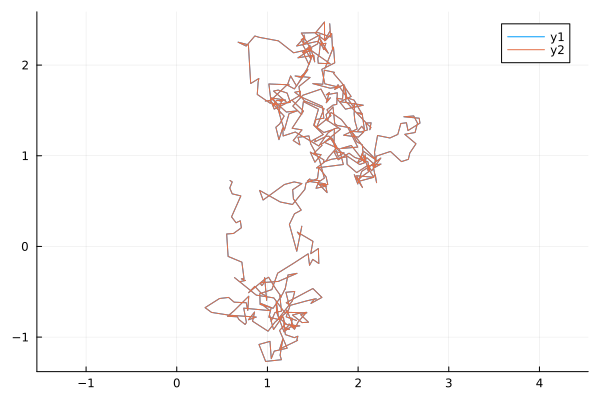

In [19]:
pot3(t) = 0.09*(t't)^2 - (t't)      # It's for the hat example
k = spe.selected_parts[1]    # Particle id



# heatmap(-3.5:0.01:3.5, -3.5:0.01:3.5,(x,y)-> pot3([x, y]))
plot(spe.paths[1, :, 1], spe.paths[2, :, 1], ratio = 1)
plot!(br_es.paths[1, :, k], br_es.paths[2, :, k], color = 2, ratio = 1)

In [6]:
xlim = [minimum(br_es.paths[1, :, :]), maximum(br_es.paths[1, :, :])]
ylim = [minimum(br_es.paths[2, :, :]), maximum(br_es.paths[2, :, :])]


anim = @animate for i in 1:sim_t
        # plot!(br_es.paths[1, 1:i, k], br_es.paths[2, 1:i, k], color = 2,
                # alpha = 0.3, xlim = xlim, ylim = ylim)
        scatter([br_es.paths[1, i, :]], [br_es.paths[2, i, :]], color = 1,
                xlim = xlim, ylim = ylim, legend = false, alpha = 0.1)
end

Animation("/tmp/jl_QEtmjn", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000491.png", "000492.png", "000493.png", "000494.png", "000495.png", "000496.png", "000497.png", "000498.png", "000499.png", "000500.png"])

In [7]:
gif(anim, "./res/anim/hat-walk-100.mp4", fps = 30)

┌ Info: Saved animation to /home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-walk-100.mp4
└ @ Plots /home/erpc/.julia/packages/Plots/QWCV6/src/animation.jl:156


Plots.AnimatedGif("/home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-walk-100.mp4")

In [8]:
anim = @animate for i in 1:sim_t
    histogram((br_es.paths[1, i, :]), bins = -5:0.2:5, legend = false, ylim = [0,1000])
    plot!(title = "Density of Particles in one dimension", xlabel = "x", ylabel = "N")
end

gif(anim, "./res/anim/hat-den-x.mp4", fps = 30)

┌ Info: Saved animation to /home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-den-x.mp4
└ @ Plots /home/erpc/.julia/packages/Plots/QWCV6/src/animation.jl:156


Plots.AnimatedGif("/home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-den-x.mp4")

In [9]:
anim = @animate for i in 1:sim_t
    histogram(sqrt.(br_es.paths[1, i, :].^2+br_es.paths[2, i, :].^2), bins = 0:0.1:10, legend = false, ylim = [0,1000])
    plot!(title = "Density of Particles in r", xlabel = "x", ylabel = "N")
end

gif(anim, "./res/anim/hat-den-r.mp4", fps = 30)

┌ Info: Saved animation to /home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-den-r.mp4
└ @ Plots /home/erpc/.julia/packages/Plots/QWCV6/src/animation.jl:156


Plots.AnimatedGif("/home/erpc/UniWorks/Research/Haghverdi/Code/FPsim/res/anim/hat-den-r.mp4")